In [1]:
import pytesseract as tess
tess.pytesseract.tesseract_cmd=r'C:\Program Files\Tesseract-OCR\tesseract.exe'
from pytesseract import image_to_string

In [2]:

from PIL import Image,ImageDraw
from pdf2image import convert_from_path
from IPython.display import display,Image
import easyocr
import numpy as np
from os import path

In [3]:
def pdf_to_image(pdf_file):
    return convert_from_path((pdf_file),poppler_path=r'C:\Program Files\poppler-0.68.0\bin')

In [4]:
def image_to_text(file):
    text=image_to_string(file)
    return text
    

In [5]:
def final_form(pdf_file):
    images=pdf_to_image(pdf_file)
    final_text=''
    for pg,img in enumerate(images):
        final_text+=image_to_text(img)
        print("page no*{}".format(pg))
        print(image_to_text(img))
        
    return final_text


In [6]:
path_to_pdf='final_test.pdf'
images=pdf_to_image(path_to_pdf)

In [7]:
print(final_form(path_to_pdf))

page no*0
GRAPHIC DESIGN USA

2021
HEALTH +
WELLNESS
DESIGN
AWARDS

58TH ANNUAL

PRINT
SURVEY r>
SPONSORED BY

VERSO

 

Melele)
TRENDS
REPORT

 

JUNE 2021

page no*1
INTRODUCING THE
ALL-NEW VERSOCO.COM.
IT’S MORE THAN A
WEBSITE. IT’S AN
INFORMATION JOY RIDE.

Deep information. True inspiration. Paper
education. Career exploration. And more.
You'll find it at the all-new Verso website,
created to provide everything you need, and
need to know, when it comes to paper.

Find the perfect paper for your project.
Get inspired by promotions that show
what's possible on great paper. Consult
Ed? the industry's most beloved education
resource. Learn the surprising facts on
paper’s—and Verso’s—contributions to a
more sustainable world. And while you're
at it, discover why Verso is a great place

to start or advance your career.

The new versoco.com. Visit us today.

versoco.com

Verso Corporation

8540 Gander Creek Drive
Miamisburg, Ohio 45342
800-258-8852

 

page no*2
 

/

(

propucts

prop

In [15]:
file1=open('output.txt','w')
print(final_form(path_to_pdf),file=file1)
file1.close()

page no*0
GRAPHIC DESIGN USA

2021
HEALTH +
WELLNESS
DESIGN
AWARDS

58TH ANNUAL

PRINT
SURVEY r>
SPONSORED BY

VERSO

 

Melele)
TRENDS
REPORT

 

JUNE 2021

page no*1
INTRODUCING THE
ALL-NEW VERSOCO.COM.
IT’S MORE THAN A
WEBSITE. IT’S AN
INFORMATION JOY RIDE.

Deep information. True inspiration. Paper
education. Career exploration. And more.
You'll find it at the all-new Verso website,
created to provide everything you need, and
need to know, when it comes to paper.

Find the perfect paper for your project.
Get inspired by promotions that show
what's possible on great paper. Consult
Ed? the industry's most beloved education
resource. Learn the surprising facts on
paper’s—and Verso’s—contributions to a
more sustainable world. And while you're
at it, discover why Verso is a great place

to start or advance your career.

The new versoco.com. Visit us today.

versoco.com

Verso Corporation

8540 Gander Creek Drive
Miamisburg, Ohio 45342
800-258-8852

 

page no*2
 

/

(

propucts

prop

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


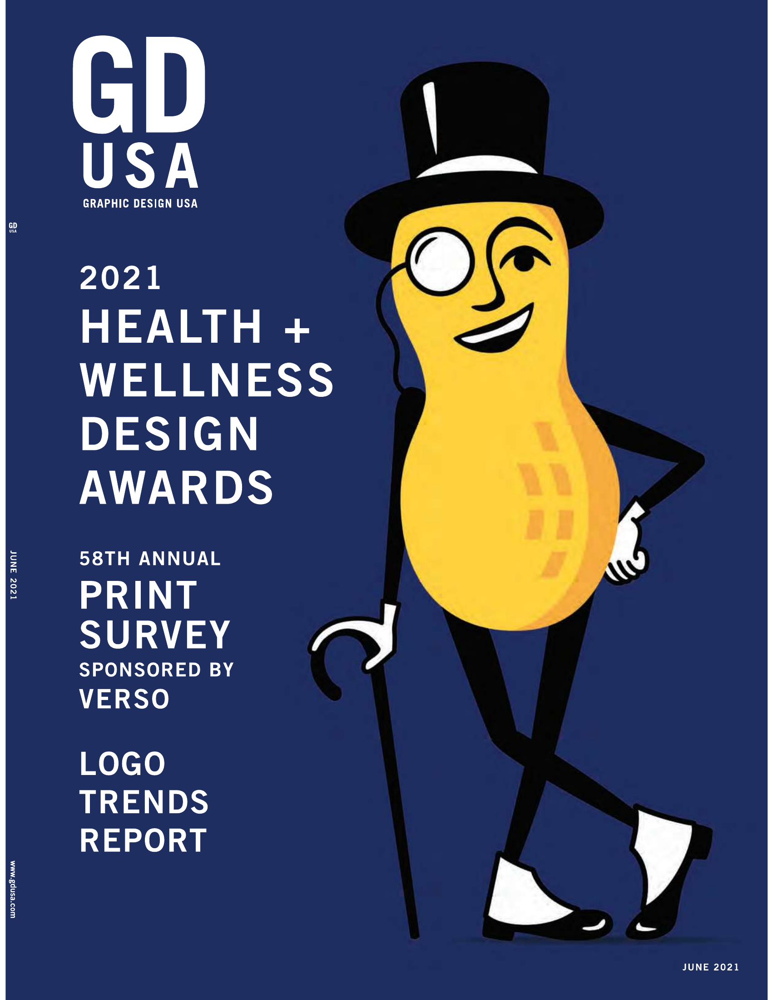

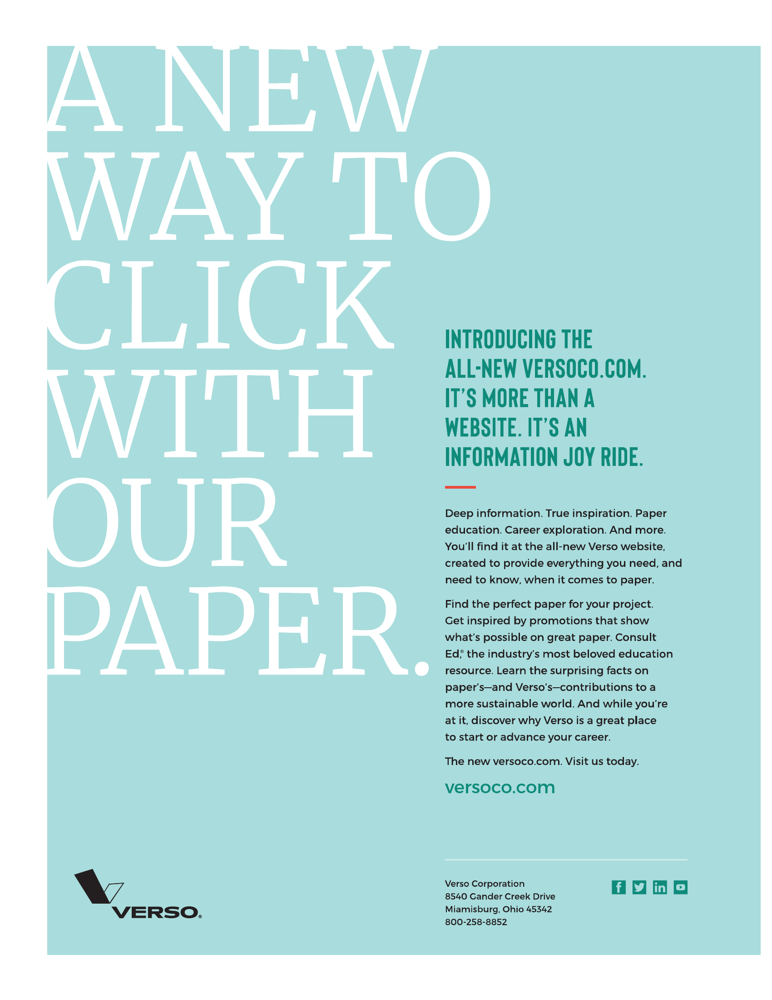

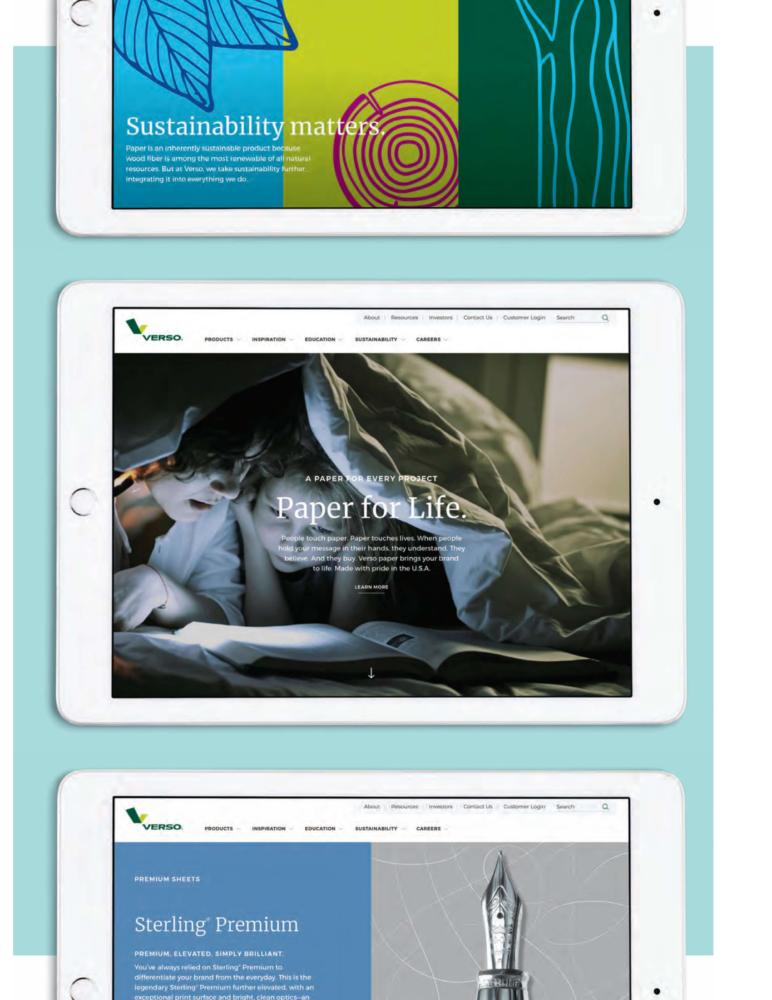

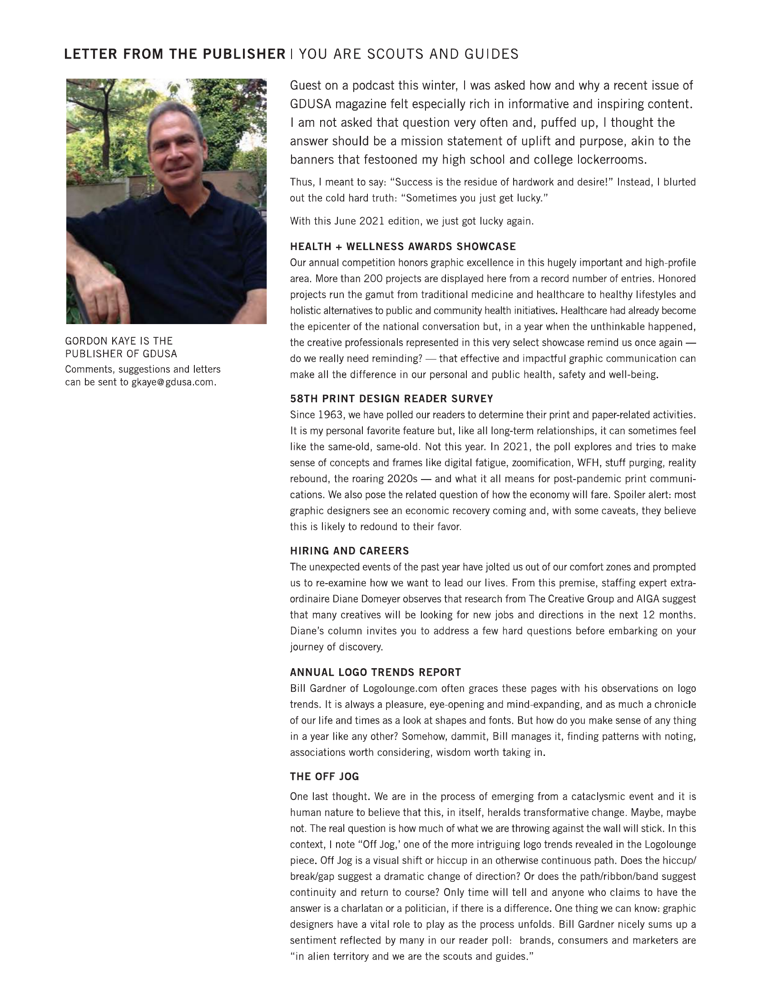

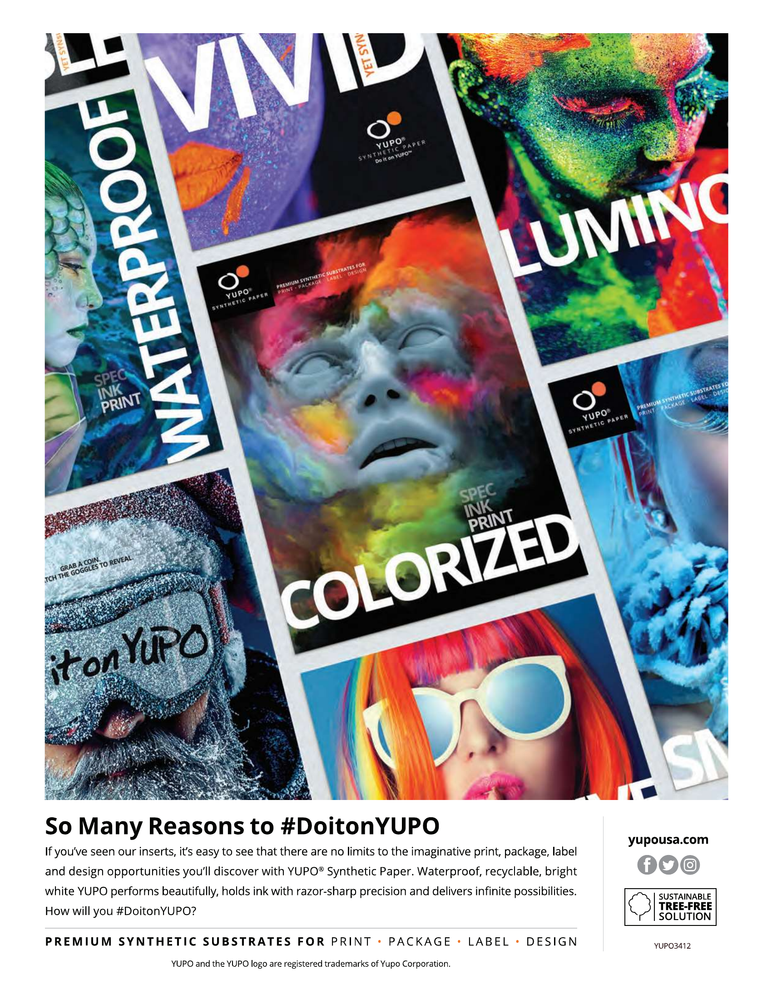

In [8]:
reader=easyocr.Reader(['en'])
for x in images:
    display(x)

In [9]:
boundary=reader.readtext(np.array(images[0]),)

C:\Users\abhis\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [10]:
def box(images,boundary,color='green',width=2):
    draw=ImageDraw.Draw(images)
    for b in boundary:
        p0,p1,p2,p3=b[0]
        draw.line([*p0,*p1,*p2,*p3,*p0],fill=color,width=width)
    return images

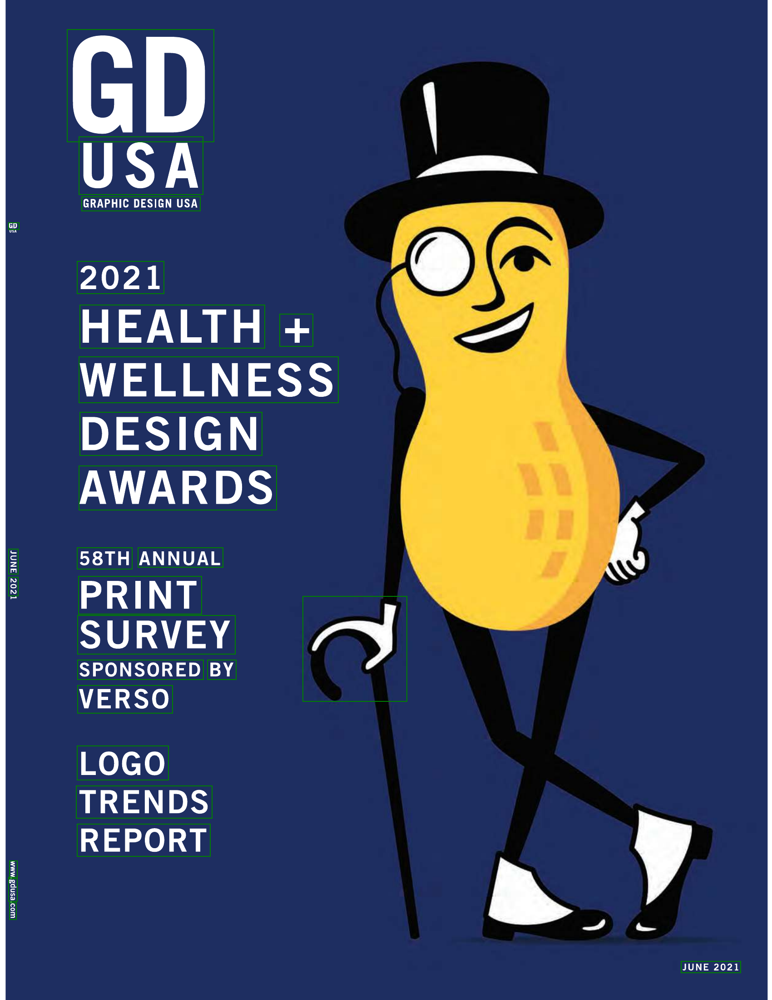

In [11]:
box(images[0],boundary)

